In [1]:
%matplotlib inline

# install pillow
!pip uninstall -y Pillow
!pip install Pillow==4.1.1

# download and unzip dataset o train
!wget http://images.cocodataset.org/zips/train2014.zip
!mkdir train
%cd /content/train
!unzip -qq /content/train2014.zip
%cd ..

#download model
!wget https://web.eecs.umich.edu/~justincj/models/vgg16-00b39a1b.pth
  
# download helper code
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/transformer.py
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/experimental.py
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/utils.py
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/vgg.py

# download style image  
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/images/mosaic.jpg

Uninstalling Pillow-4.3.0:
  Successfully uninstalled Pillow-4.3.0
    100% |████████████████████████████████| 5.7MB 6.4MB/s 
scikit-image 0.14.2 has requirement pillow>=4.3.0, but you'll have pillow 4.1.1 which is incompatible.
albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.8 which is incompatible.


--2019-04-19 23:50:45--  http://images.cocodataset.org/zips/train2014.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.216.185.19
Connecting to images.cocodataset.org (images.cocodataset.org)|52.216.185.19|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13510573713 (13G) [application/zip]
Saving to: ‘train2014.zip’

train2014.zip       100%[===================>]  12.58G  36.0MB/s    in 6m 2s   

2019-04-19 23:56:47 (35.6 MB/s) - ‘train2014.zip’ saved [13510573713/13510573713]

/content/train
/content
--2019-04-20 00:00:09--  https://s3-us-west-2.amazonaws.com/jcjohns-models/vgg16-00b39a1b.pth
Resolving s3-us-west-2.amazonaws.com (s3-us-west-2.amazonaws.com)... 52.218.196.160
Connecting to s3-us-west-2.amazonaws.com (s3-us-west-2.amazonaws.com)|52.218.196.160|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 553451520 (528M) [application/octet-stream]
Saving to: ‘vgg16-00b39a1b.pth’

vgg16-00b39a1b.pth  100%[===========

In [0]:
import PIL
from PIL import Image
import matplotlib.pyplot as plt
import os
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
import random
import numpy as np
import time
import vgg
import transformer
import experimental
import utils

In [0]:
# GLOBAL SETTINGS
TRAIN_IMAGE_SIZE = 256
DATASET_PATH = "/content/train"
NUM_EPOCHS = 1
STYLE_IMAGE_PATH = "/content/mosaic.jpg"
BATCH_SIZE = 4 
CONTENT_WEIGHT = 17
STYLE_WEIGHT = 50
TV_WEIGHT = 1e-6 
ADAM_LR = 0.001
SAVE_MODEL_PATH = "/content/"
SAVE_IMAGE_PATH = "/content/"
SAVE_MODEL_EVERY = 500 # 2,000 Images with batch size 4
SEED = 35

========Epoch 1/2========
========Iteration 1/20696========
	Content Loss:	2957439.00
	Style Loss:	201269136.00
	Total Loss:	204226576.00
Time elapsed:	0.42634057998657227 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_0.pth


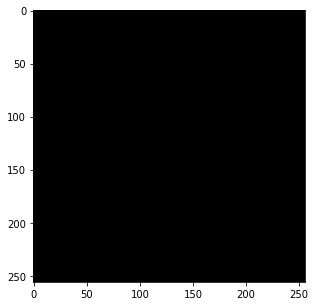

Saved sample tranformed image at /content/sample0_0.png
========Iteration 501/20696========
	Content Loss:	7946057.50
	Style Loss:	64995012.00
	Total Loss:	72941059.43
Time elapsed:	106.71867609024048 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_500.pth


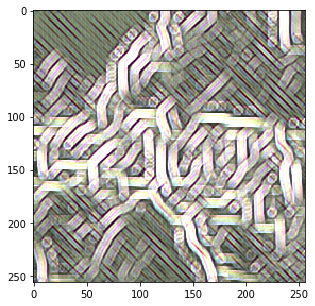

Saved sample tranformed image at /content/sample0_500.png
========Iteration 1001/20696========
	Content Loss:	8930965.00
	Style Loss:	39559908.00
	Total Loss:	48490867.40
Time elapsed:	215.11666750907898 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_1000.pth


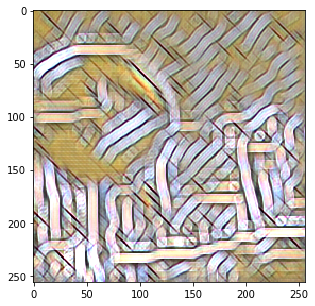

Saved sample tranformed image at /content/sample0_1000.png
========Iteration 1501/20696========
	Content Loss:	9205961.00
	Style Loss:	29046128.00
	Total Loss:	38252056.75
Time elapsed:	324.2867922782898 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_1500.pth


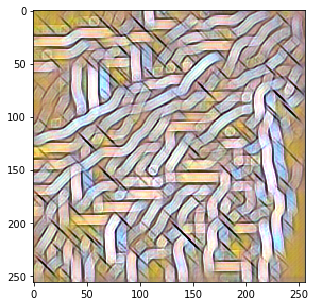

Saved sample tranformed image at /content/sample0_1500.png
========Iteration 2001/20696========
	Content Loss:	9281356.00
	Style Loss:	23310834.00
	Total Loss:	32592168.25
Time elapsed:	432.8385283946991 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_2000.pth


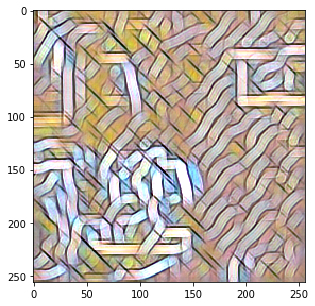

Saved sample tranformed image at /content/sample0_2000.png
========Iteration 2501/20696========
	Content Loss:	9293952.00
	Style Loss:	19698784.00
	Total Loss:	28992721.30
Time elapsed:	541.049299955368 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_2500.pth


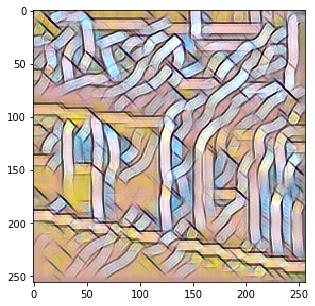

Saved sample tranformed image at /content/sample0_2500.png
========Iteration 3001/20696========
	Content Loss:	9278888.00
	Style Loss:	17200246.00
	Total Loss:	26479119.12
Time elapsed:	649.0730903148651 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_3000.pth


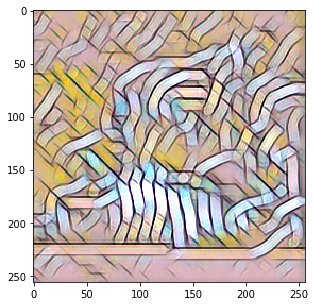

Saved sample tranformed image at /content/sample0_3000.png
========Iteration 3501/20696========
	Content Loss:	9242818.00
	Style Loss:	15360330.00
	Total Loss:	24603134.75
Time elapsed:	756.841522693634 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_3500.pth


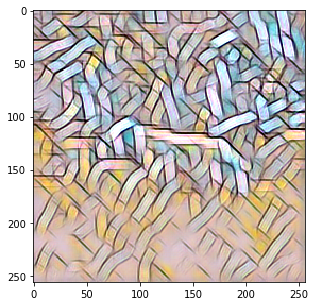

Saved sample tranformed image at /content/sample0_3500.png
========Iteration 4001/20696========
	Content Loss:	9196652.00
	Style Loss:	13943162.00
	Total Loss:	23139803.15
Time elapsed:	864.2551600933075 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_4000.pth


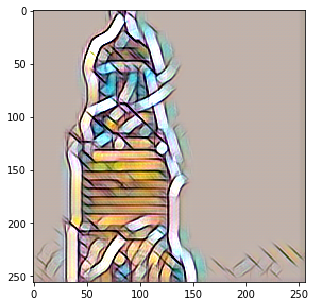

Saved sample tranformed image at /content/sample0_4000.png
========Iteration 4501/20696========
	Content Loss:	9140767.00
	Style Loss:	12808357.00
	Total Loss:	21949107.22
Time elapsed:	971.2833864688873 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_4500.pth


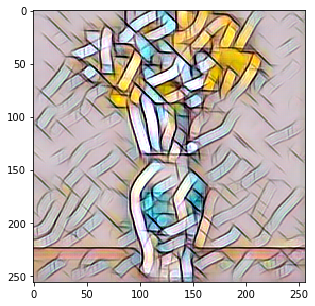

Saved sample tranformed image at /content/sample0_4500.png
========Iteration 5001/20696========
	Content Loss:	9081372.00
	Style Loss:	11878278.00
	Total Loss:	20959623.21
Time elapsed:	1077.9477741718292 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_5000.pth


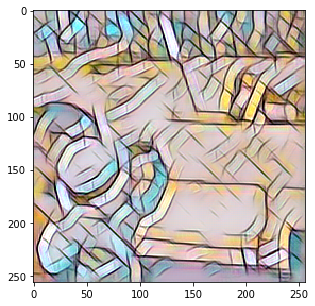

Saved sample tranformed image at /content/sample0_5000.png
========Iteration 5501/20696========
	Content Loss:	9018557.00
	Style Loss:	11103249.00
	Total Loss:	20121790.34
Time elapsed:	1184.3269865512848 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_5500.pth


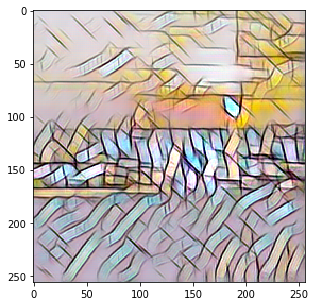

Saved sample tranformed image at /content/sample0_5500.png
========Iteration 6001/20696========
	Content Loss:	8953495.00
	Style Loss:	10445515.00
	Total Loss:	19399002.01
Time elapsed:	1290.772285938263 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_6000.pth


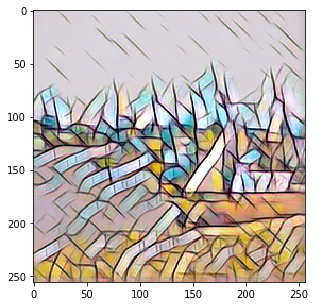

Saved sample tranformed image at /content/sample0_6000.png
========Iteration 6501/20696========
	Content Loss:	8890555.00
	Style Loss:	9883585.00
	Total Loss:	18774136.71
Time elapsed:	1397.1567921638489 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_6500.pth


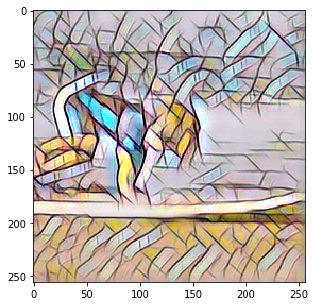

Saved sample tranformed image at /content/sample0_6500.png
========Iteration 7001/20696========
	Content Loss:	8829047.00
	Style Loss:	9395700.00
	Total Loss:	18224738.95
Time elapsed:	1503.5973224639893 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_7000.pth


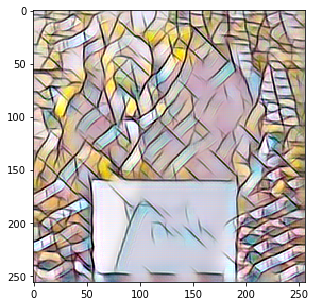

Saved sample tranformed image at /content/sample0_7000.png
========Iteration 7501/20696========
	Content Loss:	8769213.00
	Style Loss:	8967363.00
	Total Loss:	17736565.08
Time elapsed:	1609.899793624878 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_7500.pth


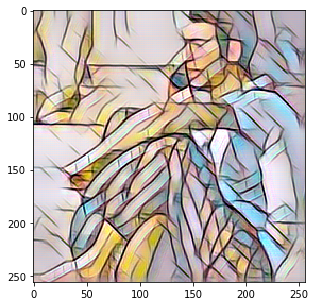

Saved sample tranformed image at /content/sample0_7500.png
========Iteration 8001/20696========
	Content Loss:	8708201.00
	Style Loss:	8588115.00
	Total Loss:	17296308.23
Time elapsed:	1716.1416070461273 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_8000.pth


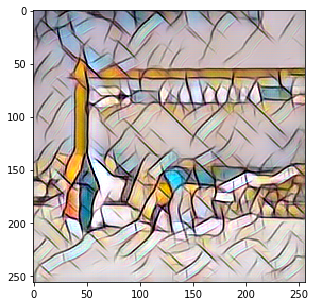

Saved sample tranformed image at /content/sample0_8000.png
========Iteration 8501/20696========
	Content Loss:	8651151.00
	Style Loss:	8253152.50
	Total Loss:	16904297.88
Time elapsed:	1822.4701309204102 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_8500.pth


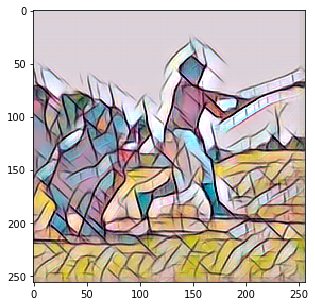

Saved sample tranformed image at /content/sample0_8500.png
========Iteration 9001/20696========
	Content Loss:	8596703.00
	Style Loss:	7952422.50
	Total Loss:	16549123.66
Time elapsed:	1928.7851779460907 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_9000.pth


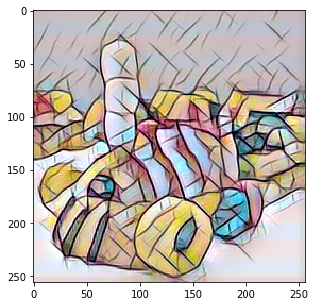

Saved sample tranformed image at /content/sample0_9000.png
========Iteration 9501/20696========
	Content Loss:	8544107.00
	Style Loss:	7679405.50
	Total Loss:	16223528.47
Time elapsed:	2035.060882806778 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_9500.pth


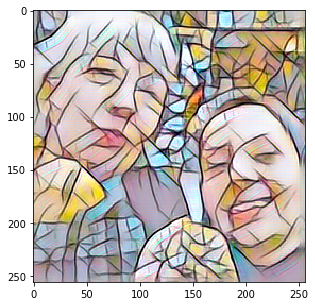

Saved sample tranformed image at /content/sample0_9500.png
========Iteration 10001/20696========
	Content Loss:	8494124.00
	Style Loss:	7431580.00
	Total Loss:	15925711.21
Time elapsed:	2141.3932971954346 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_10000.pth


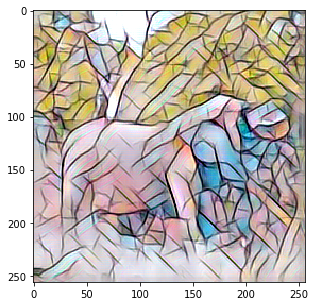

Saved sample tranformed image at /content/sample0_10000.png
========Iteration 10501/20696========
	Content Loss:	8446253.00
	Style Loss:	7205245.50
	Total Loss:	15651510.01
Time elapsed:	2247.7410349845886 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_10500.pth


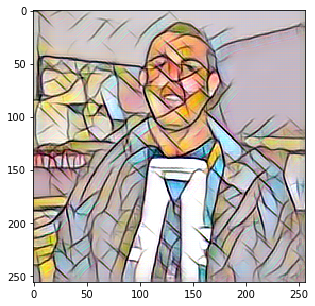

Saved sample tranformed image at /content/sample0_10500.png
========Iteration 11001/20696========
	Content Loss:	8400238.00
	Style Loss:	6997279.50
	Total Loss:	15397521.52
Time elapsed:	2354.0499470233917 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_11000.pth


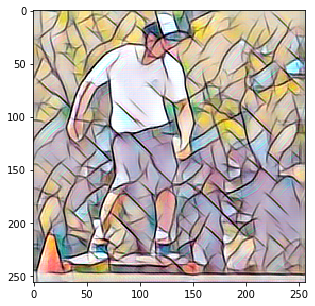

Saved sample tranformed image at /content/sample0_11000.png
========Iteration 11501/20696========
	Content Loss:	8356795.50
	Style Loss:	6806788.50
	Total Loss:	15163602.36
Time elapsed:	2460.398504257202 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_11500.pth


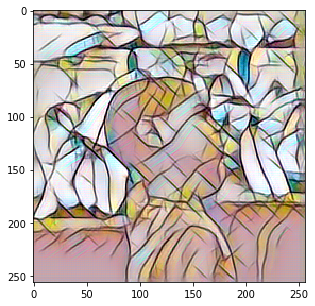

Saved sample tranformed image at /content/sample0_11500.png
========Iteration 12001/20696========
	Content Loss:	8315874.50
	Style Loss:	6629878.50
	Total Loss:	14945762.89
Time elapsed:	2566.7742414474487 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_12000.pth


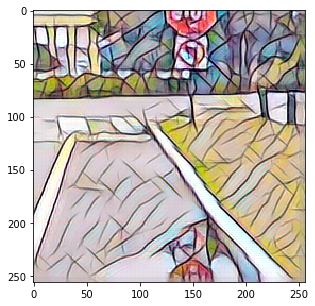

Saved sample tranformed image at /content/sample0_12000.png
========Iteration 12501/20696========
	Content Loss:	8278755.00
	Style Loss:	6471238.00
	Total Loss:	14749993.43
Time elapsed:	2673.037572145462 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_12500.pth


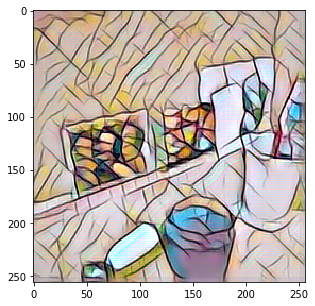

Saved sample tranformed image at /content/sample0_12500.png
========Iteration 13001/20696========
	Content Loss:	8244971.00
	Style Loss:	6321272.00
	Total Loss:	14566244.97
Time elapsed:	2779.3266611099243 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_13000.pth


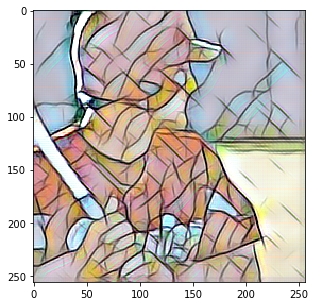

Saved sample tranformed image at /content/sample0_13000.png
========Iteration 13501/20696========
	Content Loss:	8211098.50
	Style Loss:	6180256.00
	Total Loss:	14391354.92
Time elapsed:	2885.6178245544434 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_13500.pth


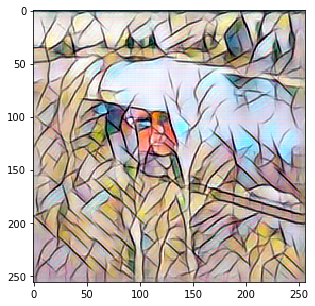

Saved sample tranformed image at /content/sample0_13500.png
========Iteration 14001/20696========
	Content Loss:	8178318.00
	Style Loss:	6047930.00
	Total Loss:	14226244.85
Time elapsed:	2991.8965129852295 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_14000.pth


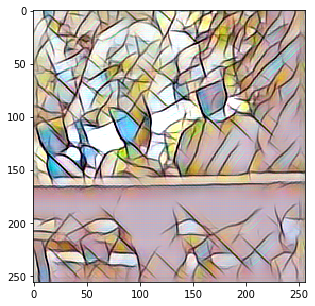

Saved sample tranformed image at /content/sample0_14000.png
========Iteration 14501/20696========
	Content Loss:	8147625.00
	Style Loss:	5925693.50
	Total Loss:	14073314.78
Time elapsed:	3098.1595413684845 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_14500.pth


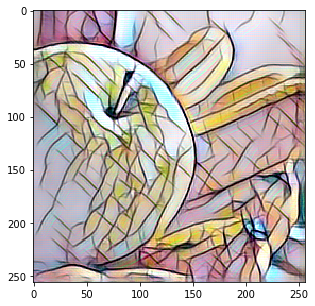

Saved sample tranformed image at /content/sample0_14500.png
========Iteration 15001/20696========
	Content Loss:	8118976.00
	Style Loss:	5809947.00
	Total Loss:	13928914.20
Time elapsed:	3204.513097047806 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_15000.pth


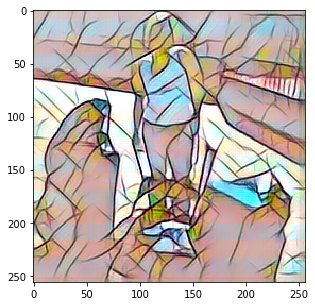

Saved sample tranformed image at /content/sample0_15000.png
========Iteration 15501/20696========
	Content Loss:	8090840.00
	Style Loss:	5701480.50
	Total Loss:	13792309.71
Time elapsed:	3310.8659546375275 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_15500.pth


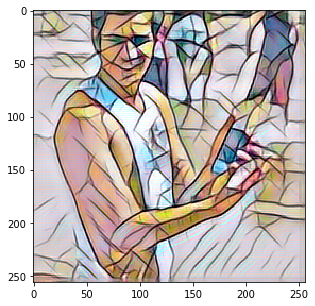

Saved sample tranformed image at /content/sample0_15500.png
========Iteration 16001/20696========
	Content Loss:	8065591.00
	Style Loss:	5599403.50
	Total Loss:	13664980.13
Time elapsed:	3417.2849793434143 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_16000.pth


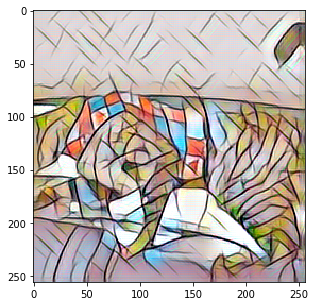

Saved sample tranformed image at /content/sample0_16000.png
========Iteration 16501/20696========
	Content Loss:	8038927.00
	Style Loss:	5502621.00
	Total Loss:	13541531.68
Time elapsed:	3523.58460187912 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_16500.pth


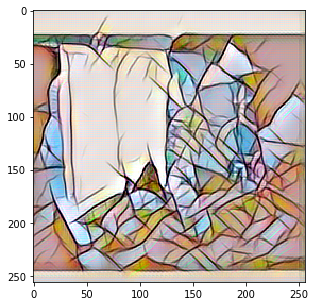

Saved sample tranformed image at /content/sample0_16500.png
========Iteration 17001/20696========
	Content Loss:	8014023.50
	Style Loss:	5411630.00
	Total Loss:	13425638.24
Time elapsed:	3629.845653295517 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_17000.pth


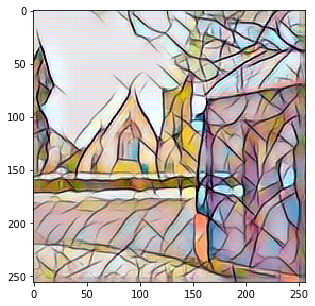

Saved sample tranformed image at /content/sample0_17000.png
========Iteration 17501/20696========
	Content Loss:	7989935.00
	Style Loss:	5325619.00
	Total Loss:	13315552.96
Time elapsed:	3736.210452079773 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_17500.pth


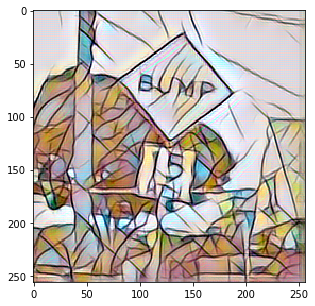

Saved sample tranformed image at /content/sample0_17500.png
========Iteration 18001/20696========
	Content Loss:	7966342.50
	Style Loss:	5243752.00
	Total Loss:	13210097.69
Time elapsed:	3842.5794594287872 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_18000.pth


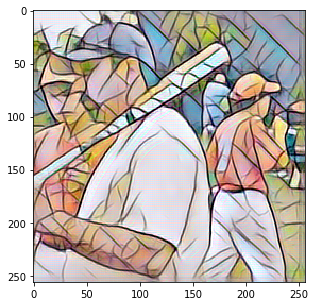

Saved sample tranformed image at /content/sample0_18000.png
========Iteration 18501/20696========
	Content Loss:	7943861.50
	Style Loss:	5166343.00
	Total Loss:	13110203.67
Time elapsed:	3948.9120383262634 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_18500.pth


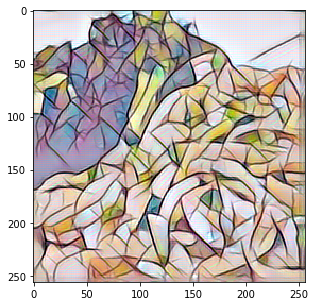

Saved sample tranformed image at /content/sample0_18500.png
========Iteration 19001/20696========
	Content Loss:	7922838.00
	Style Loss:	5092906.00
	Total Loss:	13015756.23
Time elapsed:	4055.2618832588196 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_19000.pth


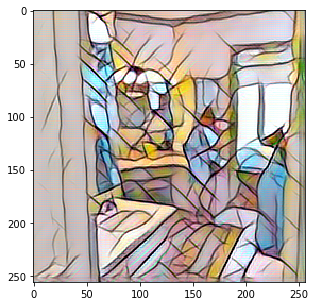

Saved sample tranformed image at /content/sample0_19000.png
========Iteration 19501/20696========
	Content Loss:	7901657.00
	Style Loss:	5022273.50
	Total Loss:	12923942.74
Time elapsed:	4161.48540520668 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_19500.pth


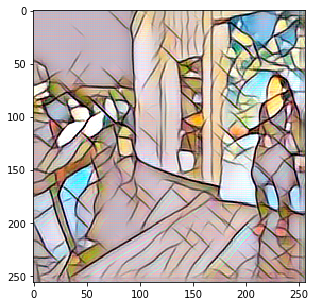

Saved sample tranformed image at /content/sample0_19500.png
========Iteration 20001/20696========
	Content Loss:	7881203.50
	Style Loss:	4955080.50
	Total Loss:	12836297.94
Time elapsed:	4267.872450590134 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_20000.pth


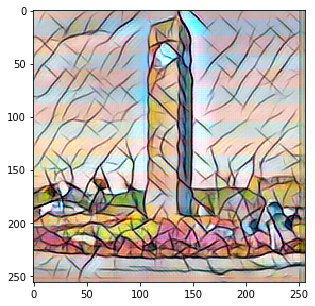

Saved sample tranformed image at /content/sample0_20000.png
========Iteration 20501/20696========
	Content Loss:	7862717.50
	Style Loss:	4891649.50
	Total Loss:	12754372.81
Time elapsed:	4374.1366810798645 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_20500.pth


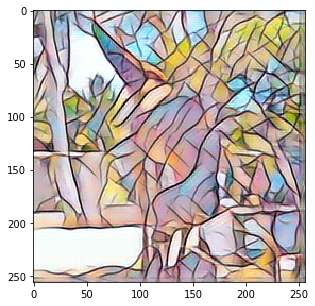

Saved sample tranformed image at /content/sample0_20500.png
========Iteration 20696/20696========
	Content Loss:	7855814.00
	Style Loss:	4867439.00
	Total Loss:	12723263.98
Time elapsed:	4415.712832212448 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_20695.pth


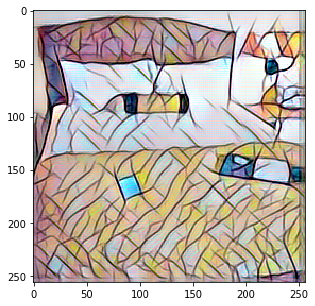

Saved sample tranformed image at /content/sample0_20695.png
Done Training the Transformer Network!
Training Time: 4415.955044031143 seconds
========Content Loss========
[204226576.0, 72941059.4251497, 48490867.3966034, 38252056.75016656, 32592168.247876063, 28992721.302678928, 26479119.118293904, 24603134.745215654, 23139803.150212448, 21949107.22061764, 20959623.205158968, 20121790.341028903, 19399002.006665554, 18774136.706352867, 18224738.946293388, 17736565.083855487, 17296308.22984627, 16904297.876249854, 16549123.66481502, 16223528.46531944, 15925711.214578543, 15651510.006285116, 15397521.52213435, 15163602.363881402, 14945762.889175901, 14749993.425965922, 14566244.971156064, 14391354.92082068, 14226244.854867509, 14073314.781532308, 13928914.203319779, 13792309.713566866, 13664980.132054247, 13541531.67868614, 13425638.240868185, 13315552.96217359, 13210097.693517027, 13110203.671963677, 13015756.226409137, 12923942.735039229, 12836297.939053047, 12754372.808594702, 12723263.9

In [5]:
def train():
    # Seeds
    torch.manual_seed(SEED)
    torch.cuda.manual_seed(SEED)
    np.random.seed(SEED)
    random.seed(SEED)

    # Device
    device = ("cuda" if torch.cuda.is_available() else "cpu")

    # Dataset and Dataloader
    transform = transforms.Compose([
        transforms.Resize(TRAIN_IMAGE_SIZE),
        transforms.CenterCrop(TRAIN_IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x.mul(255))
    ])
    train_dataset = datasets.ImageFolder(DATASET_PATH, transform=transform)
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)

    # Load networks
    #TransformerNetwork = transformer.TransformerNetwork().to(device)
    TransformerNetwork = experimental.TransformerResNextNetwork_Pruned(1.0).to(device)
    VGG = vgg.VGG16('/content/vgg16-00b39a1b.pth').to(device)

    # Get Style Features
    imagenet_neg_mean = torch.tensor([-103.939, -116.779, -123.68], dtype=torch.float32).reshape(1,3,1,1).to(device)
    imagenet_mean = torch.tensor([103.939, 116.779, 123.68], dtype=torch.float32).reshape(1,3,1,1).to(device)
    style_image = utils.load_image(STYLE_IMAGE_PATH)
    style_tensor = utils.itot(style_image).to(device)
    style_tensor = style_tensor.add(imagenet_neg_mean)
    B, C, H, W = style_tensor.shape
    style_features = VGG(style_tensor.expand([BATCH_SIZE, C, H, W]))
    style_gram = {}
    for key, value in style_features.items():
        style_gram[key] = utils.gram(value)

    # Optimizer settings
    optimizer = optim.Adam(TransformerNetwork.parameters(), lr=ADAM_LR)

    # Loss trackers
    content_loss_history = []
    style_loss_history = []
    total_loss_history = []
    batch_content_loss_sum = 0
    batch_style_loss_sum = 0
    batch_total_loss_sum = 0

    # Optimization/Training Loop
    batch_count = 1
    start_time = time.time()
    for epoch in range (1, NUM_EPOCHS+1):
        print("========Epoch {}/{}========".format(epoch, NUM_EPOCHS+1))
        for batch_id, (content_batch, _) in enumerate(train_loader):
            # Current Batch size in case of odd batches
            curr_batch_size = content_batch.shape[0]
            
            # Zero-out Gradients
            optimizer.zero_grad()

            # Generate images and get features
            content_batch = content_batch[:,[2,1,0]].to(device)
            generated_batch = TransformerNetwork(content_batch)
            content_features = VGG(content_batch.add(imagenet_neg_mean))
            generated_features = VGG(generated_batch.add(imagenet_neg_mean))

            # Content Loss
            MSELoss = nn.MSELoss().to(device)
            content_loss = CONTENT_WEIGHT * MSELoss(content_features['relu2_2'], generated_features['relu2_2'])            
            batch_content_loss_sum += content_loss

            # Style Loss
            style_loss = 0
            for key, value in generated_features.items():
                s_loss = MSELoss(utils.gram(value), style_gram[key][:curr_batch_size])
                style_loss += s_loss
            style_loss *= STYLE_WEIGHT
            batch_style_loss_sum += style_loss

            # Total Loss
            total_loss = content_loss + style_loss
            batch_total_loss_sum += total_loss.item()

            # Backprop and Weight Update
            total_loss.backward()
            optimizer.step()

            # Save Model and Print Losses
            if (((batch_count-1)%SAVE_MODEL_EVERY == 0) or (batch_count==NUM_EPOCHS*len(train_loader))):
                # Print Losses
                print("========Iteration {}/{}========".format(batch_count, NUM_EPOCHS*len(train_loader)))
                print("\tContent Loss:\t{:.2f}".format(batch_content_loss_sum/batch_count))
                print("\tStyle Loss:\t{:.2f}".format(batch_style_loss_sum/batch_count))
                print("\tTotal Loss:\t{:.2f}".format(batch_total_loss_sum/batch_count))
                print("Time elapsed:\t{} seconds".format(time.time()-start_time))

                # Save Model
                checkpoint_path = SAVE_MODEL_PATH + "checkpoint_" + str(batch_count-1) + ".pth"
                torch.save(TransformerNetwork.state_dict(), checkpoint_path)
                print("Saved TransformerNetwork checkpoint file at {}".format(checkpoint_path))

                # Save sample generated image
                sample_tensor = generated_batch[0].clone().detach().unsqueeze(dim=0)
                sample_image = utils.ttoi(sample_tensor.clone().detach())
                sample_image_path = SAVE_IMAGE_PATH + "sample0_" + str(batch_count-1) + ".png"
                utils.saveimg(sample_image, sample_image_path)
                utils.show(sample_image)
                print("Saved sample tranformed image at {}".format(sample_image_path))

                # Save loss histories
                content_loss_history.append(batch_total_loss_sum/batch_count)
                style_loss_history.append(batch_style_loss_sum/batch_count)
                total_loss_history.append(batch_total_loss_sum/batch_count)

            # Iterate Batch Counter
            batch_count+=1

    stop_time = time.time()
    # Print loss histories
    print("Done Training the Transformer Network!")
    print("Training Time: {} seconds".format(stop_time-start_time))
    print("========Content Loss========")
    print(content_loss_history) 
    print("========Style Loss========")
    print(style_loss_history) 
    print("========Total Loss========")
    print(total_loss_history) 

    # Save TransformerNetwork weights
    TransformerNetwork.eval()
    TransformerNetwork.cpu()
    final_path = SAVE_MODEL_PATH + "transformer_weight.pth"
    print("Saving TransformerNetwork weights at {}".format(final_path))
    torch.save(TransformerNetwork.state_dict(), final_path)
    print("Done saving final model")

train()